In [1]:
import mdtraj as md
import numpy as np
from matplotlib import pyplot as plt
from mpl_toolkits import mplot3d
import statsmodels.api as sm
from matplotlib import animation
from IPython.display import HTML
import matplotlib
from scipy.interpolate import interp1d
from scipy import interpolate
matplotlib.rcParams['animation.embed_limit'] = 2**128

In [2]:
a = md.load('initial_promb.pdb').topology
table, bonds = a.to_dataframe()

table.loc[ table.chainID==0, 'resSeq'] = table['resSeq'][table.chainID==0].values + 815
table.loc[ table.chainID==1, 'resSeq'] = table['resSeq'][table.chainID==1].values + 815
table.loc[ table.chainID==2, 'resSeq'] = table['resSeq'][table.chainID==2].values + 815

table.loc[ table.chainID==3, 'resSeq'] = table['resSeq'][table.chainID==3].values + 685
table.loc[ table.chainID==4, 'resSeq'] = table['resSeq'][table.chainID==4].values + 685
table.loc[ table.chainID==5, 'resSeq'] = table['resSeq'][table.chainID==5].values + 685

start_loc = np.array([816,856,912,985,1035,1128,1163,1214,1238,1273,686,815])
domain_name = ['FP','CR','HR1','CH','BH','RFH','HR2','TM','CT','GP']

table_protein = table[table['name']=='BB'][['serial','resSeq','resName','chainID']]
serial_start = table_protein[table_protein['resSeq']==1]['serial'].values - 1
serial_end = np.append(serial_start[1:], np.max(table_protein['serial'].values)) - 1


start_serial = np.zeros((3, len(start_loc)))
for i in range(len(start_loc)):
    start_serial[:,i] = table_protein[table_protein['resSeq']==start_loc[i]].values[:,0]

for i in range(len(start_loc)-3):
    print('name %s or name BB and fragment %d to %d %d to %d %d to %d'%(domain_name[i], \
        start_serial[0,i], start_serial[0,i+1]-1, start_serial[1,i], start_serial[1,i+1]-1, 
        start_serial[2,i], start_serial[2,i+1]-1,))

i = i + 1
print('name %s or name BB and fragment %d to %d %d to %d %d to %d'%(domain_name[i], \
    start_serial[0,i], start_serial[1,i]-1, start_serial[1,i], start_serial[2,i]-1, \
    start_serial[2,i], start_serial[2,i+1]-1,))

name FP or name BB and fragment 2 to 87 989 to 1074 1976 to 2061
name CR or name BB and fragment 88 to 198 1075 to 1185 2062 to 2172
name HR1 or name BB and fragment 199 to 345 1186 to 1332 2173 to 2319
name CH or name BB and fragment 346 to 444 1333 to 1431 2320 to 2418
name BH or name BB and fragment 445 to 664 1432 to 1651 2419 to 2638
name RFH or name BB and fragment 665 to 746 1652 to 1733 2639 to 2720
name HR2 or name BB and fragment 747 to 858 1734 to 1845 2721 to 2832
name TM or name BB and fragment 859 to 909 1846 to 1896 2833 to 2883
name CT or name BB and fragment 910 to 986 1897 to 1973 2884 to 2960
name GP or name BB and fragment 987 to 1973 1974 to 2960 2961 to 3516


In [3]:
start_loc = np.array([686,702,771,815,881])
domain_name = ['f1','GP','f2','gg']

table_protein = table[table['name']=='BB'][['serial','resSeq','resName','chainID']]
serial_start = table_protein[table_protein['resSeq']==1]['serial'].values - 1
serial_end = np.append(serial_start[1:], np.max(table_protein['serial'].values)) - 1


start_serial = np.zeros((3, len(start_loc)))
for i in range(len(start_loc)):
    start_serial[:,i] = table_protein[table_protein['resSeq']==start_loc[i]].values[:,0]

for i in range(len(start_loc)-2):
    print('name %s or name BB and fragment %d to %d %d to %d %d to %d'%(domain_name[i], \
        start_serial[0,i], start_serial[0,i+1]-1, start_serial[1,i], start_serial[1,i+1]-1, 
        start_serial[2,i], start_serial[2,i+1]-1,))

i = i + 1
print('name %s or name BB and fragment %d to %d %d to %d %d to %d'%(domain_name[i], \
    start_serial[0,i], start_serial[1,i]-1, start_serial[1,i], start_serial[2,i]-1, \
    start_serial[2,i], start_serial[2,i+1]-1,))

name f1 or name BB and fragment 2963 to 2992 3240 to 3269 3517 to 3546
name GP or name BB and fragment 2993 to 3135 3270 to 3412 3547 to 3689
name f2 or name BB and fragment 3136 to 3237 3413 to 3514 3690 to 3791
name gg or name BB and fragment 3238 to 3514 3515 to 3791 3792 to 2108


In [4]:
def read_traj(index):
    
    global xyz_pro, xyz_dppc, xyz_pro_fit_center, table_pro, table
    
    traj = md.load_xtc('run%d/sys_hydro_run_10.xtc'%index, top = 'initial_promb.pdb')
    xyz = traj.xyz
    top = traj.topology
    table, bonds = top.to_dataframe()
    
    table.loc[ table.chainID==0, 'resSeq'] = table['resSeq'][table.chainID==0].values + 815
    table.loc[ table.chainID==1, 'resSeq'] = table['resSeq'][table.chainID==1].values + 815
    table.loc[ table.chainID==2, 'resSeq'] = table['resSeq'][table.chainID==2].values + 815

    table.loc[ table.chainID==3, 'resSeq'] = table['resSeq'][table.chainID==3].values + 685
    table.loc[ table.chainID==4, 'resSeq'] = table['resSeq'][table.chainID==4].values + 685
    table.loc[ table.chainID==5, 'resSeq'] = table['resSeq'][table.chainID==5].values + 685
    
    table_pro =  table[table.chainID < 3]
    xyz_pro = xyz[:,table.chainID < 3,:]
    xyz_dppc = xyz[:,(table.resName == 'DPPC') ,:]
    table_pro_fit = table_pro[(table_pro.resSeq > 911)&(table_pro.resSeq < 1238)&(table_pro.name == 'BB')]
    xyz_pro_fit = xyz_pro[:,(table_pro.resSeq > 911)&(table_pro.resSeq < 1238)&(table_pro.name == 'BB'),:]
    chain_length_pro_fit = int(np.shape(xyz_pro_fit)[1]/3)
    xyz_pro_fit1 = xyz_pro_fit[:,:chain_length_pro_fit,:]
    xyz_pro_fit2 = xyz_pro_fit[:,chain_length_pro_fit:2*chain_length_pro_fit,:]
    xyz_pro_fit3 = xyz_pro_fit[:,2*chain_length_pro_fit:,:]
    xyz_pro_fit_center = (xyz_pro_fit1+xyz_pro_fit2+xyz_pro_fit3)/3

In [5]:
def fit_curve(frame_num,s_num,trunc,poly):
    
    n_diff = 260
    n_overlap = 20
    
    global xyz_pro_fit_center
    global x_fit, y_fit, z_fit, x_fit_norm, y_fit_norm, z_fit_norm
    global x_fit_norm1, x_fit_norm2,  y_fit_norm1, y_fit_norm2,  z_fit_norm1, z_fit_norm2
    global x_rotate1, x_rotate2, y_rotate1, y_rotate2, z_rotate1, z_rotate2
    global xz1, xz2, yz1, yz2, xyz1, xyz2, xyz1_final, xyz2_final
    global xyz_final
    
    x_fit = xyz_pro_fit_center[frame_num,:,0]
    y_fit = xyz_pro_fit_center[frame_num,:,1]
    z_fit = xyz_pro_fit_center[frame_num,:,2]

    x_fit_norm = x_fit - np.mean(x_fit)
    y_fit_norm = y_fit - np.mean(y_fit)
    z_fit_norm = z_fit - np.mean(z_fit)

    x_fit_norm1 = x_fit_norm[:n_diff+n_overlap]
    y_fit_norm1 = y_fit_norm[:n_diff+n_overlap]
    z_fit_norm1 = z_fit_norm[:n_diff+n_overlap]
    points_data1 = np.array([x_fit_norm1,y_fit_norm1,z_fit_norm1])
    covMatrix1 = np.cov(points_data1)
    a1,b1 = np.linalg.eigh(covMatrix1)

    x_rotate1 = np.dot(b1.T, points_data1)[0,:]
    y_rotate1 = np.dot(b1.T, points_data1)[1,:]
    z_rotate1 = np.dot(b1.T, points_data1)[2,:]

    lowess = sm.nonparametric.lowess
    xz1 = lowess(x_rotate1, z_rotate1, frac = 0.1, it=10)
    yz1 = lowess(y_rotate1, z_rotate1, frac = 0.1, it=10)
    xyz1 = [xz1[np.unique(xz1[:,0], return_index=True)[1],1],yz1[np.unique(xz1[:,0], return_index=True)[1],1],xz1[np.unique(xz1[:,0], return_index=True)[1],0]]

    xyz1_final = np.dot(np.linalg.inv(b1.T), xyz1)
    if(np.dot(xyz1_final[:,-1]-xyz1_final[:,0], points_data1[:,-1]-points_data1[:,0])<0):
        xyz1_final = xyz1_final[:, ::-1]


    x_fit_norm2 = x_fit_norm[n_diff-n_overlap:]
    y_fit_norm2 = y_fit_norm[n_diff-n_overlap:]
    z_fit_norm2 = z_fit_norm[n_diff-n_overlap:]
    points_data2 = np.array([x_fit_norm2,y_fit_norm2,z_fit_norm2])

    covMatrix2 = np.cov(points_data2)
    a2,b2 = np.linalg.eigh(covMatrix2)

    x_rotate2 = np.dot(b2.T, points_data2)[0,:]
    y_rotate2 = np.dot(b2.T, points_data2)[1,:]
    z_rotate2 = np.dot(b2.T, points_data2)[2,:]

    lowess = sm.nonparametric.lowess
    xz2 = lowess(x_rotate2, z_rotate2, frac = 0.1, it=10)
    yz2 = lowess(y_rotate2, z_rotate2, frac = 0.1, it=10)
    xyz2 = [xz2[np.unique(xz2[:,0], return_index=True)[1],1],yz2[np.unique(xz2[:,0], return_index=True)[1],1],xz2[np.unique(xz2[:,0], return_index=True)[1],0]]

    xyz2_final = np.dot(np.linalg.inv(b2.T), xyz2)
    if(np.dot(xyz2_final[:,-1]-xyz2_final[:,0], points_data2[:,-1]-points_data2[:,0])<0):
        xyz2_final = xyz2_final[:, ::-1]

    #xyz_final = np.append(np.append(xyz1_final[:,:n_diff-n_overlap], (xyz1_final[:,n_diff-n_overlap:n_diff+n_overlap]+xyz2_final[:,:2*n_overlap])/2 ,axis=1), xyz2_final[:,2*n_overlap:],axis=1)

    xyz_final = np.append(np.append(xyz1_final[:,:-2*n_overlap], (xyz1_final[:,-2*n_overlap:]+xyz2_final[:,:2*n_overlap])/2 ,axis=1), xyz2_final[:,2*n_overlap:],axis=1)


    tck,u = interpolate.splprep(xyz_final,k=poly,s=trunc)
    u = np.linspace(0,1,s_num)
    fit_out = np.array(interpolate.splev(u,tck))
    fit_out[0,:] = fit_out[0,:] + np.mean(x_fit)
    fit_out[1,:] = fit_out[1,:] + np.mean(y_fit)
    fit_out[2,:] = fit_out[2,:] + np.mean(z_fit)
    
    z_tm_n = xyz_pro_fit_center[frame_num,1213-912,2]
    #out = fit_out[:,fit_out[2] > z_tm_n]
    out = fit_out.copy()
    
    return out[0], out[1], out[2]

In [6]:
def cal_curvature(frame_num,s_num):
    
    global xyz_pro_fit_center
    
    x_inter, y_inter, z_inter = fit_curve(frame_num,s_num,trunc,poly)
    z_tm_n = xyz_pro_fit_center[frame_num,1213-912,2]
    
    s_inter = np.zeros(np.shape(z_inter))
    s_inter[1:] = np.cumsum(np.sqrt((x_inter[1:]-x_inter[:-1])**2 + (y_inter[1:]-y_inter[:-1])**2 + (z_inter[1:]-z_inter[:-1])**2))
    
    s_num_total = round((s_num-1)/(len(z_inter[z_inter > z_tm_n])-1)*(len(z_inter)-1)+1)
    
    s_ei = np.linspace(0, s_inter[-1], s_num_total)
    fsx = interp1d(s_inter, x_inter, kind='cubic')
    fsy = interp1d(s_inter, y_inter, kind='cubic')
    fsz = interp1d(s_inter, z_inter, kind='cubic')
    x_s = fsx(s_ei)
    y_s = fsy(s_ei)
    z_s = fsz(s_ei)
    
    d2rds2 = np.zeros((3, len(s_ei)))
    ds = s_ei[1] - s_ei[0]
    d2rds2[0,1:-1] = (x_s[2:] + x_s[:-2] - 2 * x_s[1:-1])/ds**2
    d2rds2[0,0] = (2*x_s[0] -5*x_s[1] +4*x_s[2] -1*x_s[3])/ds**2
    d2rds2[0,-1] = (2*x_s[-1] -5*x_s[-2] +4*x_s[-3] -1*x_s[-4])/ds**2
    d2rds2[1,1:-1] = (y_s[2:] + y_s[:-2] - 2 * y_s[1:-1])/ds**2
    d2rds2[1,0] = (2*y_s[0] -5*y_s[1] +4*y_s[2] -1*y_s[3])/ds**2
    d2rds2[1,-1] = (2*y_s[-1] -5*y_s[-2] +4*y_s[-3] -1*y_s[-4])/ds**2
    d2rds2[2,1:-1] = (z_s[2:] + z_s[:-2] - 2 * z_s[1:-1])/ds**2
    d2rds2[2,0] = (2*z_s[0] -5*z_s[1] +4*z_s[2] -1*z_s[3])/ds**2
    d2rds2[2,-1] = (2*z_s[-1] -5*z_s[-2] +4*z_s[-3] -1*z_s[-4])/ds**2
    
    curvature_s = np.linalg.norm(d2rds2, axis=0)
    xyz_s = [x_s, y_s, z_s]
    
    return s_ei, curvature_s, xyz_s

In [7]:
def plot_snapshot(frame_num):
    
    global curve_x, curve_y, curve_z
    
    fig = plt.figure(figsize=(12,12))
    ax = plt.axes(projection='3d')
    ax.set_proj_type('ortho')
    ax.axis('off')
    
    X = xyz_pro[frame_num,:,0]
    Y = xyz_pro[frame_num,:,1]
    Z = xyz_pro[frame_num,:,2]

    curve_x, curve_y, curve_z =  fit_curve(frame_num,s_num,trunc,poly)

    X_DPPC = xyz_dppc[frame_num,:,0]
    Y_DPPC = xyz_dppc[frame_num,:,1]
    Z_DPPC = xyz_dppc[frame_num,:,2]

    # Create cubic bounding box to simulate equal aspect ratio
    max_range = np.array([X_DPPC.max()-X_DPPC.min(), Y_DPPC.max()-Y_DPPC.min(), Z.max()-Z.min()]).max()
    Xb = 0.5*max_range*np.mgrid[-1:2:2,-1:2:2,-1:2:2][0].flatten() + 0.5*(X_DPPC.max()+X_DPPC.min())
    Yb = 0.5*max_range*np.mgrid[-1:2:2,-1:2:2,-1:2:2][1].flatten() + 0.5*(Y_DPPC.max()+Y_DPPC.min())
    Zb = 0.5*max_range*np.mgrid[-1:2:2,-1:2:2,-1:2:2][2].flatten() + 0.5*(Z.max()+Z.min())
    
    # Comment or uncomment following both lines to test the fake bounding box:
    for xb, yb, zb in zip(Xb, Yb, Zb):
        ax.plot([xb], [yb], [zb], 'w')
    
    plot0, = ax.plot3D([],[],[],'o',ms=3,alpha=0.2,c='tab:purple')
    plot1, = ax.plot3D([],[],[],'o',ms=3,alpha=0.2,c='tab:blue')
    plot2, = ax.plot3D([],[],[],'r',lw=3)
    plot3, = ax.plot3D([],[],[],'o',ms=2,alpha=0.1,c='tab:green')
    
    plot0.set_data_3d(X[(table_pro.resSeq<911)&(table_pro.resSeq>813)],Y[(table_pro.resSeq<911)&(table_pro.resSeq>813)],Z[(table_pro.resSeq<911)&(table_pro.resSeq>813)])
    plot1.set_data_3d(X[table_pro.resSeq>911],Y[table_pro.resSeq>911], Z[table_pro.resSeq>911]) 
    plot2.set_data_3d(curve_x, curve_y, curve_z)
    plot3.set_data_3d(X_DPPC, Y_DPPC, Z_DPPC)

    ax.view_init(elev=0.)
    

In [42]:
read_traj(5)

In [9]:
poly = 4
trunc = 4
s_num = 1001

In [45]:
def set_animation2():
    global fig, ax, X, Y, Z, plot1, plot2, plot3, txt, Xb, Yb,Zb, txt
    fig = plt.figure(figsize=(10,10))
    fig.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9)
    ax = fig.add_subplot(111, autoscale_on=False, projection='3d')    
    ax.set_zlim([0,40])
    ax.set_xlim([0,30])
    ax.set_ylim([0,30])
    ax.axis('off')
    ax.set_proj_type('ortho')
    
    plot1, = ax.plot3D([],[],[],'o',ms=3,alpha=0.2,c='tab:blue')
    plot2, = ax.plot3D([],[],[],'r',lw=2)
    plot3, = ax.plot3D([],[],[],'o',ms=2,alpha=0.02,c='tab:green')
    txt = ax.text2D(0.65, 0.95, "2D Text", transform=ax.transAxes, fontsize=14)
    
    plt.close(fig)

def init2():
    #plot1.set_data_3d(X,Y,Z) 
    #plot2.set_data_3d(xz[:,1], yz[:,1], xz[:,0])
    return plot1, plot2

def animate2(i):
    #global Xb,Yb,Zb
    frame_num = i*10 + frame_start
    
    X = xyz_pro[frame_num,:,0]
    Y = xyz_pro[frame_num,:,1]
    Z = xyz_pro[frame_num,:,2]
    
    curve_x, curve_y, curve_z =  fit_curve(frame_num,s_num,trunc,poly)
    
    X_DPPC = xyz_dppc[frame_num,:,0]
    Y_DPPC = xyz_dppc[frame_num,:,1]
    Z_DPPC = xyz_dppc[frame_num,:,2]
    
    plot1.set_data_3d(X,Y,Z) 
    plot2.set_data_3d(curve_x, curve_y, curve_z)
    plot3.set_data_3d(X_DPPC, Y_DPPC, Z_DPPC)
    
    ax.view_init(elev=0.,azim=0)
    
    txt.set_text('time = %s µs' %((frame_num-frame_start)/250))
    
    return plot1, plot2, plot3, txt
    

In [47]:
frame_start = 0
plt.close('all')
set_animation2()
# Animate
anim = animation.FuncAnimation(fig, animate2, init_func=init2,
                               frames=201, interval=50, blit=True)
HTML(anim.to_jshtml())

In [48]:
# Set up formatting for the movie files
Writer = animation.writers['ffmpeg']
writer = Writer(fps=15, metadata=dict(artist='Me'), bitrate=1800)

In [49]:
anim.save('movie3.mp4', writer=writer)

In [21]:
read_traj(3)

(0.0, 2.0)

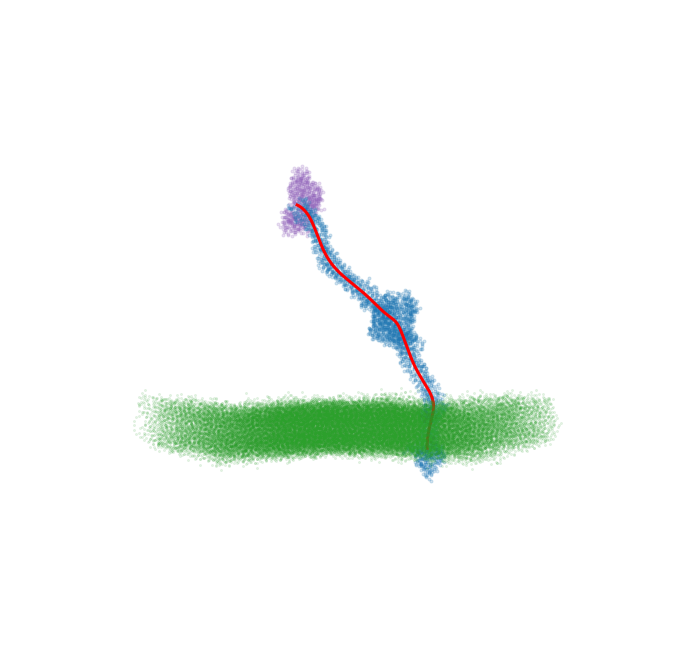

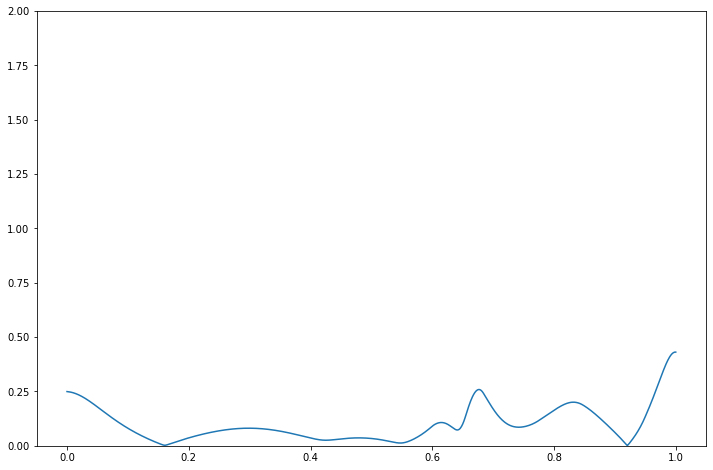

In [22]:
poly = 4
trunc = 4
s_num = 1001
frame_num = 1400
plot_snapshot(frame_num)
s_ei, curvature_s, xyz_s = cal_curvature(frame_num, s_num)
plt.figure(figsize=(12,8))
plt.plot(np.linspace(0,1,s_num), curvature_s[:s_num])
plt.ylim([0,2])

([], <a list of 0 Text major ticklabel objects>)

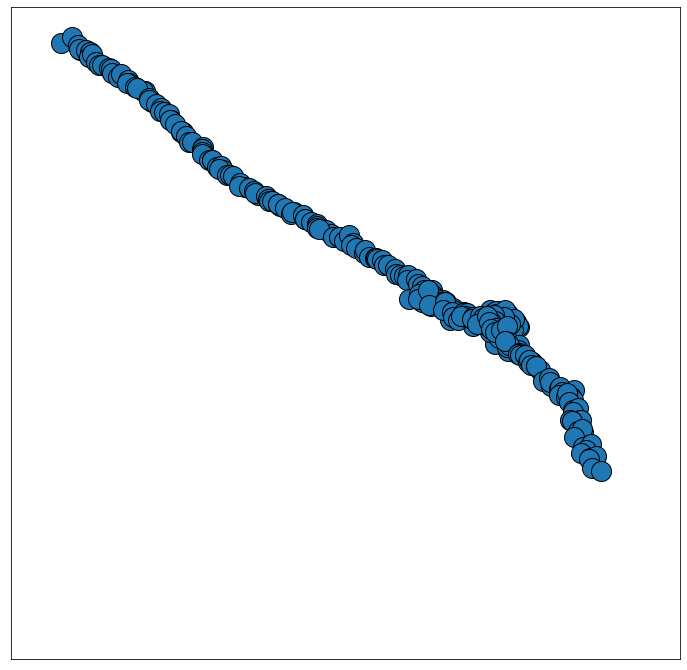

In [23]:
plt.figure(figsize = (12,12))
plt.plot(y_fit_norm1, z_fit_norm1, 'o', ms=20, markeredgecolor = 'k',markeredgewidth=1)
plt.plot(y_fit_norm2, z_fit_norm2, 'ro', ms=0, markeredgecolor = 'w', markerfacecolor = 'w')
plt.axis('equal')
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text major ticklabel objects>)

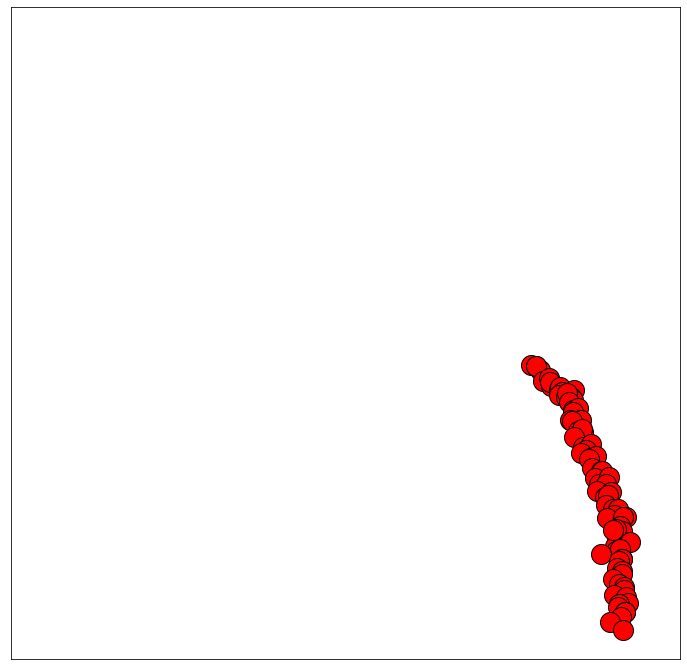

In [24]:
plt.figure(figsize = (12,12))
plt.plot(y_fit_norm1, z_fit_norm1, 'bo', ms=0, markeredgecolor = 'w', markerfacecolor = 'w')
plt.plot(y_fit_norm2, z_fit_norm2, 'ro', ms=20, markeredgecolor = 'k')
plt.axis('equal')
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text major ticklabel objects>)

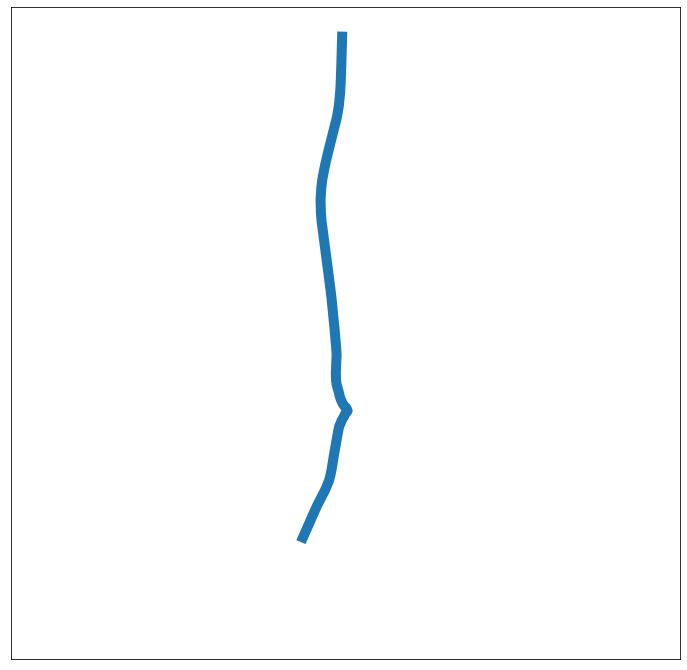

In [25]:
plt.figure(figsize = (12,12))
plt.plot(yz1[:,1],yz1[:,0],linewidth = 10)
plt.plot(yz2[:,1],yz2[:,0],linewidth = 0)
plt.axis('equal')
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text major ticklabel objects>)

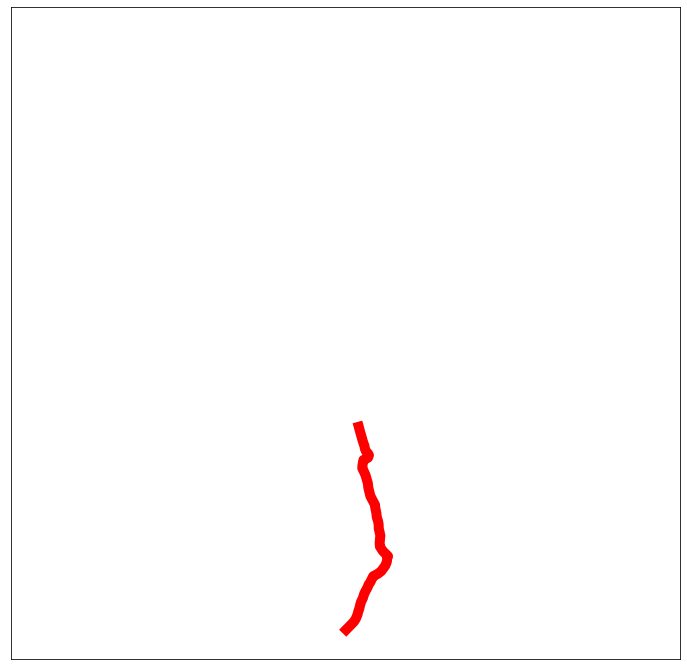

In [26]:
plt.figure(figsize = (12,12))

plt.plot(yz2[:,1],yz2[:,0],linewidth = 10, color='r')
plt.plot(yz1[:,1],yz1[:,0],linewidth = 10, color='w')
plt.axis('equal')
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text major ticklabel objects>)

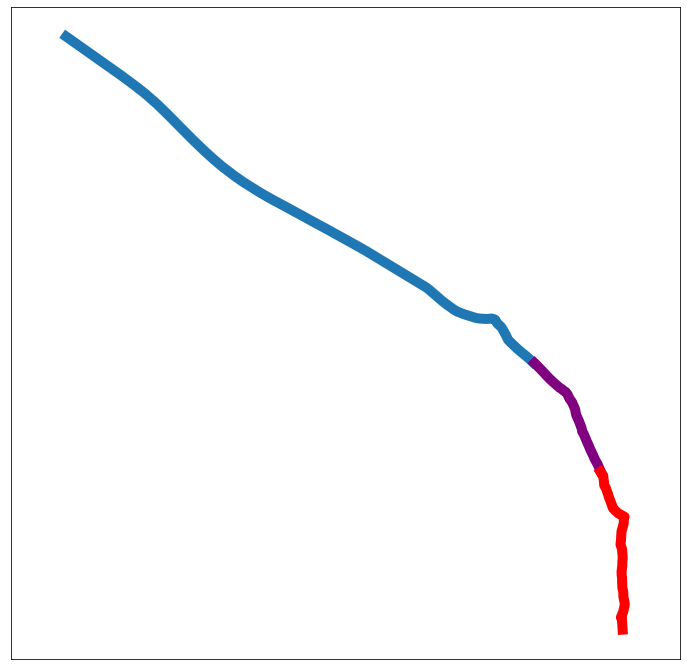

In [27]:
plt.figure(figsize = (12,12))
plt.plot(xyz_final[1,:260-20],xyz_final[2,:260-20],linewidth = 10)
plt.plot(xyz_final[1,260-20:260+20],xyz_final[2,260-20:260+20],linewidth = 10, color = 'purple')
plt.plot(xyz_final[1,260+20:],xyz_final[2,260+20:],linewidth = 10, color = 'red')
plt.axis('equal')
plt.xticks([])
plt.yticks([])

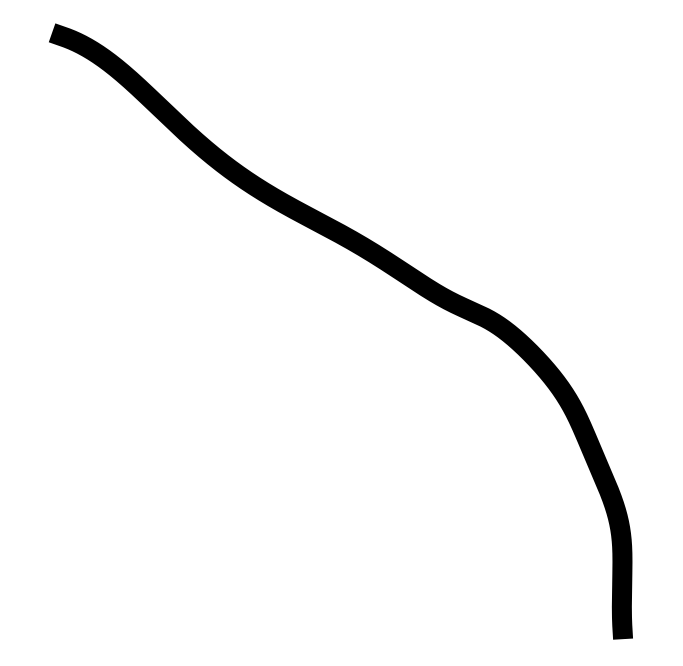

In [33]:
plt.figure(figsize = (12,12))
plt.plot(curve_y,curve_z,linewidth = 20, color = 'k')
plt.axis('equal')
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.savefig('demo.png', transparent=True)